In [1]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl

plt.style.use("seaborn-v0_8-white")

# =========================
# Helpers
# =========================

def cm_to_inch(x):
    return x / 2.54


def metric_display_name(metric):
    metric_names = {"Human_Inf": "Human Infection Prevalence (%)",
                    "Mosquitoes_Inf": "Mosquito Infection Prevalence (%)",
                    "HPC": "Human Polyclonal Prevalence (%)",
                    "MPC": "Mosquito Polyclonal Prevalence (%)",
                    "lambda_h": r"Human Force of Infection - $\lambda_H$ $(year^{-1})$",
                    "lambda_v": r"Mosquito Force of Infection - $\lambda_V$ $(year^{-1})$",
                    "MOI_Humans_mean": "Human Multiplicity of Infection",
                    "MOI_Humans_median": "Human Multiplicity of Infection",
                    "MOI_Mosquitoes_mean": "Mosquito Multiplicity of Infection",
                    "MOI_Mosquitoes_median": "Mosquito Multiplicity of Infection",
                    "PI_Humans": r"Human Haplotypic Genetic Diversity - $\pi_H$ (%)",
                    "PI_Mosquitoes": r"Mosquito Haplotypic Genetic Diversity - $\pi_V$ (%)",
                    "SH_Humans": r"Human Normalized Shannon Diversity Index",
                    "SH_Mosquitoes": "Mosquito Normalized Shannon Diversity Index",
                    "ratio_reco": "Recombination Ratio (%)",
                    "num_haplotypes": "Total Number of Haplotypes"}
    
    return metric_names.get(metric, metric)


def transmission_display_name(br):
    transmission_names = {"0.3": "Low Transmission",
                          "1.0": "Intermediate Transmission",
                          "3.0": "High Transmission"}
    return transmission_names.get(str(br), f"BR = {br}")


def get_text_color(value, norm, cmap):
    rgba = cmap(norm(value))
    r, g, b = rgba[:3]
    luminance = 0.2126 * r + 0.7152 * g + 0.0722 * b
    return "black" if luminance > 0.5 else "white"

def apply_conversions(df, num_hum, num_mos, ratio_reco_as_percent=True):
    for col in ["HS", "HM", "HPC"]:
        if col in df.columns:
            df[col] = 100.0 * df[col] / num_hum

    for col in ["MS", "MC", "MPC"]:
        if col in df.columns:
            df[col] = 100.0 * df[col] / num_mos

    if "PI_Humans" in df.columns:
        df["PI_Humans"] *= 100.0

    if "PI_Mosquitoes" in df.columns:
        df["PI_Mosquitoes"] *= 100.0

    if ratio_reco_as_percent and "ratio_reco" in df.columns:
        df["ratio_reco"] *= 100.0

    if "HS" in df.columns:
        df["Human_Inf"] = 100.0 - df["HS"]

    if "MS" in df.columns:
        df["Mosquitoes_Inf"] = 100.0 - df["MS"]

    return df


def load_one_replica_final_value(filepath,metric,num_hum,num_mos,
                                 convert_to_years=True,ratio_reco_as_percent=True):

    df = pd.read_csv(filepath, sep=";")

    if convert_to_years and "time" in df.columns:
        df["time_years"] = df["time"] / 365.0
        xname = "time_years"
    else:
        xname = "time"

    if xname not in df.columns:
        return np.nan

    df = apply_conversions(df,num_hum=num_hum,num_mos=num_mos,
                           ratio_reco_as_percent=ratio_reco_as_percent)

    if metric not in df.columns:
        return np.nan

    df = df.sort_values(xname)
    return float(df.iloc[-1][metric])

def load_all_replicates_final_values(sim_name,metric,num_humans,mos_x_human,
                                     results_root="./results/Comparative_Simulations",
                                     convert_to_years=True, ratio_reco_as_percent=True):

    folder = os.path.join(results_root, sim_name)
    pattern = os.path.join(folder, "Iteration_proof_*.txt")
    files = sorted(glob.glob(pattern))

    if len(files) == 0:
        print(f"[WARN] No hay archivos para: {sim_name}")
        return []

    num_mos = num_humans * mos_x_human
    vals = []

    for f in files:
        v = load_one_replica_final_value(filepath=f,metric=metric,num_hum=num_humans,
                                         num_mos=num_mos,convert_to_years=convert_to_years,
                                         ratio_reco_as_percent=ratio_reco_as_percent)
        if np.isfinite(v):
            vals.append(v)

    return vals

def summarize_values(vals):
    if len(vals) == 0:
        return np.nan, np.nan, np.nan

    vals = np.asarray(vals, dtype=float)
    center_val = np.median(vals)
    q1 = np.percentile(vals, 25)
    q3 = np.percentile(vals, 75)

    return center_val, q1, q3

def plot_comparative_heatmap_panel(metric,igd_values=(10, 50, 90),
                                   bite_rates=(0.3, 1.0, 3.0),
                                   num_hum_values=(30, 50, 70),
                                   mos_x_hum_values=(3, 5, 7),
                                   results_root="./results/Comparative_Simulations",
                                   ratio_reco_as_percent=True,
                                   cmap_name="seismic",
                                   width_cm=16,
                                   height_cm=18,
                                   name_fig=None,
                                   outdir="./Figures",
                                   fontsize_center=7.5,
                                   fontsize_spread=5.5,
                                   center_decimals=2,
                                   spread_decimals=1,dpi=600):
    cmap = plt.get_cmap(cmap_name)

    panel_data = {}
    all_centers = []

    for igd in igd_values:
        for br in bite_rates:
            mat = np.full((len(mos_x_hum_values), len(num_hum_values)), np.nan)
            q1_mat = np.full((len(mos_x_hum_values), len(num_hum_values)), np.nan)
            q3_mat = np.full((len(mos_x_hum_values), len(num_hum_values)), np.nan)

            for i, mxh in enumerate(mos_x_hum_values):
                for j, nh in enumerate(num_hum_values):
                    sim_name = f"IGD_{igd}_BR_{br}_NH_{nh}_MxH_{mxh}"

                    vals = load_all_replicates_final_values(sim_name=sim_name,
                                                            metric=metric,
                                                            num_humans=nh,mos_x_human=mxh,
                                                            results_root=results_root,
                                                            ratio_reco_as_percent=ratio_reco_as_percent)

                    center_val, q1, q3 = summarize_values(vals)
                    mat[i, j] = center_val
                    q1_mat[i, j] = q1
                    q3_mat[i, j] = q3

                    if np.isfinite(center_val):
                        all_centers.append(center_val)

            panel_data[(igd, br)] = (mat, q1_mat, q3_mat)

    if len(all_centers) == 0:
        raise ValueError("No se encontraron datos válidos para esa métrica.")

    vmin, vmax = np.min(all_centers), np.max(all_centers)
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)

    figsize = (cm_to_inch(width_cm), cm_to_inch(height_cm))
    fig, axes = plt.subplots(nrows=len(igd_values),ncols=len(bite_rates),figsize=figsize)

    if len(igd_values) == 1 and len(bite_rates) == 1:
        axes = np.array([[axes]])
    elif len(igd_values) == 1:
        axes = np.array([axes])
    elif len(bite_rates) == 1:
        axes = np.array([[ax] for ax in axes])

    fig.subplots_adjust(left=0.10,right=0.88,bottom=0.08,
                        top=0.83,wspace=0.20,hspace=0.1)

    im = None

    for r, igd in enumerate(igd_values):
        for c, br in enumerate(bite_rates):
            ax = axes[r, c]
            mat, q1_mat, q3_mat = panel_data[(igd, br)]

            im = ax.imshow(mat,cmap=cmap,norm=norm,origin="lower",aspect="equal")

            ax.set_xticks(range(len(num_hum_values)))
            ax.set_xticklabels(num_hum_values, fontsize=8)
            ax.set_yticks(range(len(mos_x_hum_values)))
            ax.set_yticklabels(mos_x_hum_values, fontsize=8)

            if r == len(igd_values) - 1:
                ax.set_xlabel("Number of humans", fontsize=8)

            if c == 0:
                ax.set_ylabel("Mosquitoes per human", fontsize=8)

            if r == 0:
                ax.set_title(transmission_display_name(br), fontsize=8, pad=6)

            if c == len(bite_rates) - 1:
                ax.text(1.2, 0.5, f"I.G.D.\n{igd}%",
                        transform=ax.transAxes, rotation=0,
                        va="center", ha="center",fontsize=10)

            ax.set_xticks(np.arange(-0.5, len(num_hum_values), 1), minor=True)
            ax.set_yticks(np.arange(-0.5, len(mos_x_hum_values), 1), minor=True)
            ax.grid(which="minor", color="black", linestyle="-", linewidth=0.8)
            ax.tick_params(axis="x", which="major", length=2.5, width=0.7, direction="out")
            ax.tick_params(axis="y", which="major", length=2.5, width=0.7, direction="out")

            for i in range(len(mos_x_hum_values)):
                for j in range(len(num_hum_values)):
                    if np.isfinite(mat[i, j]):
                        text_color = get_text_color(mat[i, j], norm, cmap)
                        center_txt = f"{mat[i, j]:.{center_decimals}f}"
                        spread_txt = f"{q1_mat[i, j]:.{spread_decimals}f}–{q3_mat[i, j]:.{spread_decimals}f}"

                        ax.text(j, i + 0.13,center_txt,ha="center",va="center",
                                fontsize=fontsize_center,color=text_color,fontweight="semibold")

                        ax.text(j, i - 0.16,spread_txt,ha="center",va="center",
                                fontsize=fontsize_spread,color=text_color)

                    else:
                        ax.text(j, i,"NA",ha="center",va="center",
                                fontsize=fontsize_center,color="white")

    cbar_ax = fig.add_axes([0.20, 0.87, 0.60, 0.02])  # [left, bottom, width, height]
    cbar = fig.colorbar(im, cax=cbar_ax, orientation="horizontal")
    cbar.set_label(metric_display_name(metric), fontsize=10, labelpad=6)
    cbar.ax.xaxis.set_label_position("top")
    cbar.ax.xaxis.set_ticks_position("top")
    cbar.ax.tick_params(labelsize=9)

    os.makedirs(outdir, exist_ok=True)

    if name_fig is None:
        name_fig = metric

    outpath = os.path.join(outdir, f"{name_fig}.png")
    plt.savefig(outpath, dpi=dpi, bbox_inches="tight")
    print(f"Figura guardada en: {outpath}")

    plt.show()

    return fig, axes

Figura guardada en: ./Figures/Figure_S7.png


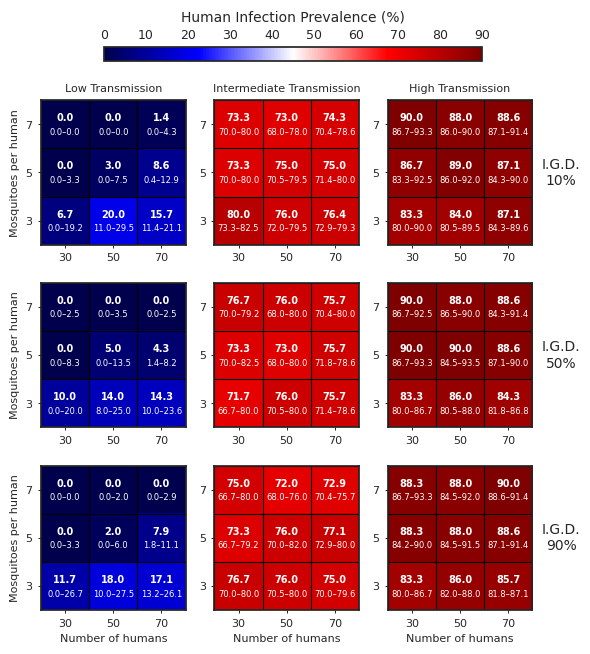

(<Figure size 629.921x708.661 with 10 Axes>,
 array([[<Axes: title={'center': 'Low Transmission'}, ylabel='Mosquitoes per human'>,
         <Axes: title={'center': 'Intermediate Transmission'}>,
         <Axes: title={'center': 'High Transmission'}>],
        [<Axes: ylabel='Mosquitoes per human'>, <Axes: >, <Axes: >],
        [<Axes: xlabel='Number of humans', ylabel='Mosquitoes per human'>,
         <Axes: xlabel='Number of humans'>,
         <Axes: xlabel='Number of humans'>]], dtype=object))

In [2]:
plot_comparative_heatmap_panel(metric="Human_Inf",
                               name_fig="Figure_S8",
                               fontsize_center=7,fontsize_spread=6,
                               center_decimals=1, spread_decimals=1)

Figura guardada en: ./Figures/Figure_S8.png


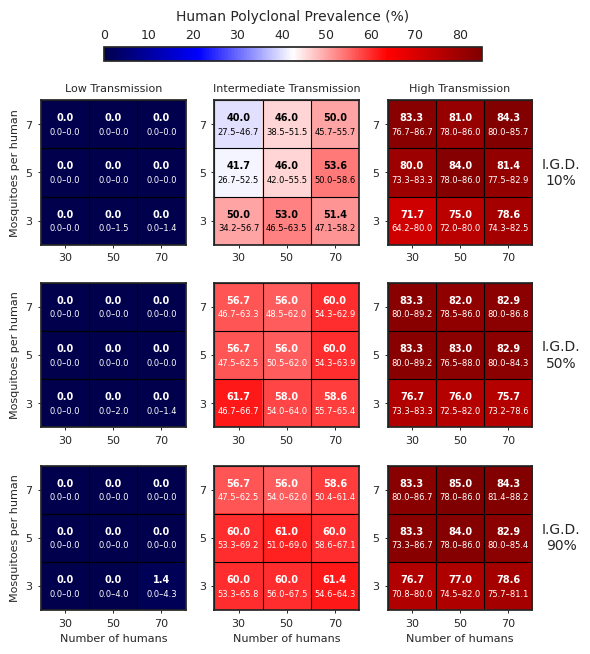

(<Figure size 629.921x708.661 with 10 Axes>,
 array([[<Axes: title={'center': 'Low Transmission'}, ylabel='Mosquitoes per human'>,
         <Axes: title={'center': 'Intermediate Transmission'}>,
         <Axes: title={'center': 'High Transmission'}>],
        [<Axes: ylabel='Mosquitoes per human'>, <Axes: >, <Axes: >],
        [<Axes: xlabel='Number of humans', ylabel='Mosquitoes per human'>,
         <Axes: xlabel='Number of humans'>,
         <Axes: xlabel='Number of humans'>]], dtype=object))

In [3]:
plot_comparative_heatmap_panel(metric="HPC",
                               name_fig="Figure_S9",
                               fontsize_center=7,fontsize_spread=6,
                               center_decimals=1, spread_decimals=1)

Figura guardada en: ./Figures/Figure_S9.png


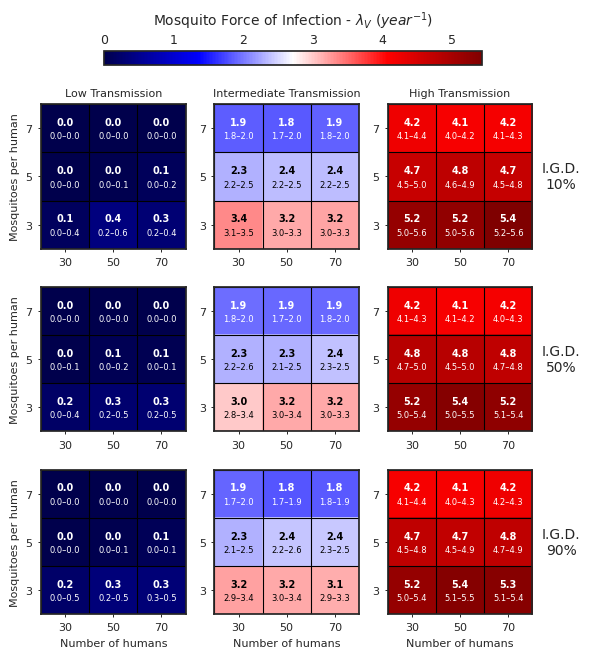

(<Figure size 629.921x708.661 with 10 Axes>,
 array([[<Axes: title={'center': 'Low Transmission'}, ylabel='Mosquitoes per human'>,
         <Axes: title={'center': 'Intermediate Transmission'}>,
         <Axes: title={'center': 'High Transmission'}>],
        [<Axes: ylabel='Mosquitoes per human'>, <Axes: >, <Axes: >],
        [<Axes: xlabel='Number of humans', ylabel='Mosquitoes per human'>,
         <Axes: xlabel='Number of humans'>,
         <Axes: xlabel='Number of humans'>]], dtype=object))

In [4]:
plot_comparative_heatmap_panel(metric="lambda_v",
                               name_fig="Figure_S10",
                               fontsize_center=7,fontsize_spread=6,
                               center_decimals=1, spread_decimals=1)



Figura guardada en: ./Figures/Figure_S10.png


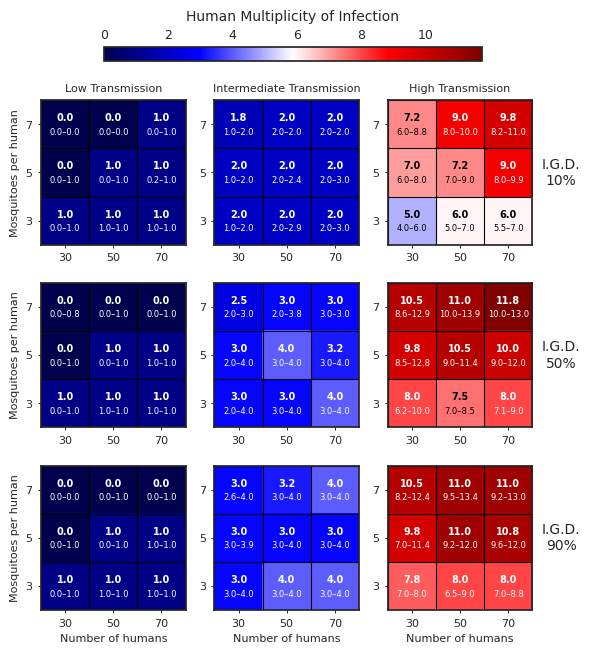

(<Figure size 629.921x708.661 with 10 Axes>,
 array([[<Axes: title={'center': 'Low Transmission'}, ylabel='Mosquitoes per human'>,
         <Axes: title={'center': 'Intermediate Transmission'}>,
         <Axes: title={'center': 'High Transmission'}>],
        [<Axes: ylabel='Mosquitoes per human'>, <Axes: >, <Axes: >],
        [<Axes: xlabel='Number of humans', ylabel='Mosquitoes per human'>,
         <Axes: xlabel='Number of humans'>,
         <Axes: xlabel='Number of humans'>]], dtype=object))

In [5]:
plot_comparative_heatmap_panel(metric="MOI_Humans_median",
                               name_fig="Figure_S11",
                               fontsize_center=7,fontsize_spread=6,
                               center_decimals=1, spread_decimals=1)



Figura guardada en: ./Figures/Figure_S11.png


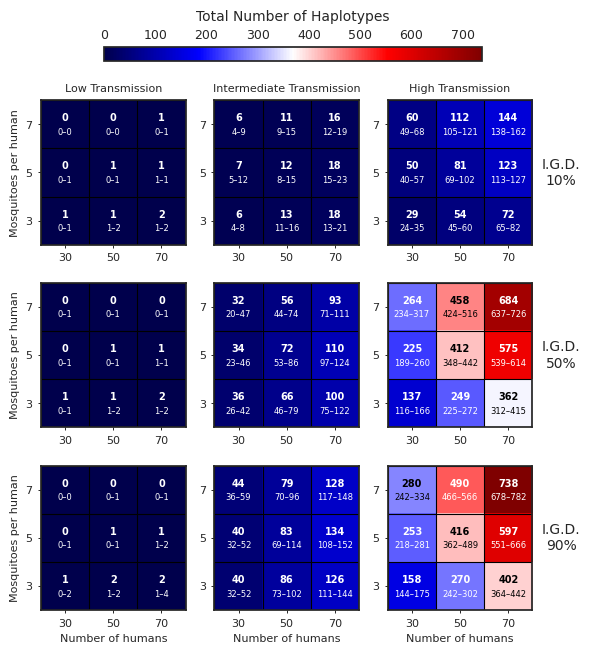

(<Figure size 629.921x708.661 with 10 Axes>,
 array([[<Axes: title={'center': 'Low Transmission'}, ylabel='Mosquitoes per human'>,
         <Axes: title={'center': 'Intermediate Transmission'}>,
         <Axes: title={'center': 'High Transmission'}>],
        [<Axes: ylabel='Mosquitoes per human'>, <Axes: >, <Axes: >],
        [<Axes: xlabel='Number of humans', ylabel='Mosquitoes per human'>,
         <Axes: xlabel='Number of humans'>,
         <Axes: xlabel='Number of humans'>]], dtype=object))

In [6]:
plot_comparative_heatmap_panel(metric="num_haplotypes",
                               name_fig="Figure_S12",
                               fontsize_center=7,fontsize_spread=6,
                               center_decimals=0, spread_decimals=0)

Figura guardada en: ./Figures/Figure_S12.png


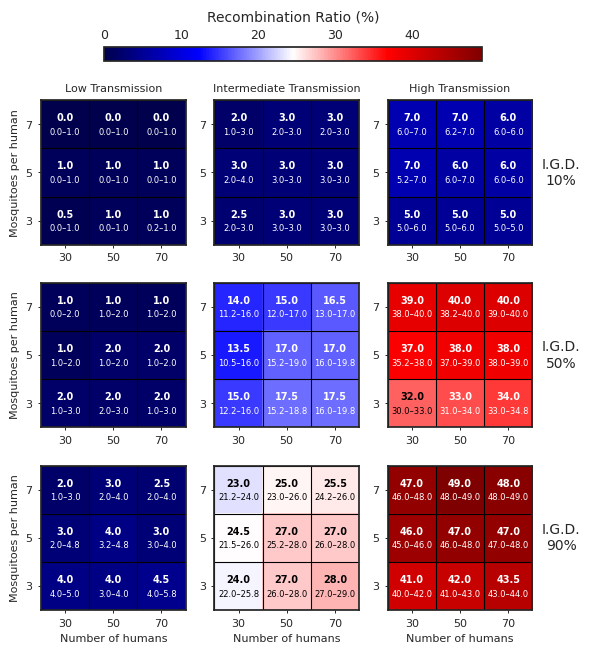

(<Figure size 629.921x708.661 with 10 Axes>,
 array([[<Axes: title={'center': 'Low Transmission'}, ylabel='Mosquitoes per human'>,
         <Axes: title={'center': 'Intermediate Transmission'}>,
         <Axes: title={'center': 'High Transmission'}>],
        [<Axes: ylabel='Mosquitoes per human'>, <Axes: >, <Axes: >],
        [<Axes: xlabel='Number of humans', ylabel='Mosquitoes per human'>,
         <Axes: xlabel='Number of humans'>,
         <Axes: xlabel='Number of humans'>]], dtype=object))

In [7]:
plot_comparative_heatmap_panel(metric="ratio_reco",
                               name_fig="Figure_S13",
                               fontsize_center=7,fontsize_spread=6,
                               center_decimals=1, spread_decimals=1)

Figura guardada en: ./Figures/Figure_S13.png


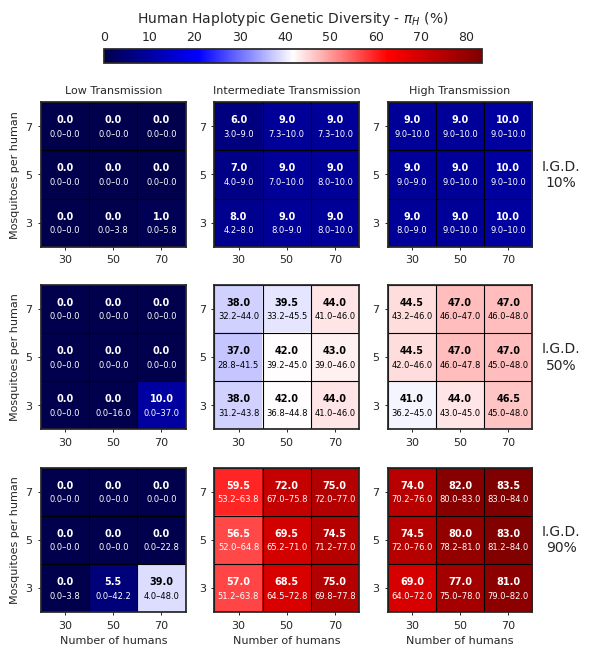

(<Figure size 629.921x708.661 with 10 Axes>,
 array([[<Axes: title={'center': 'Low Transmission'}, ylabel='Mosquitoes per human'>,
         <Axes: title={'center': 'Intermediate Transmission'}>,
         <Axes: title={'center': 'High Transmission'}>],
        [<Axes: ylabel='Mosquitoes per human'>, <Axes: >, <Axes: >],
        [<Axes: xlabel='Number of humans', ylabel='Mosquitoes per human'>,
         <Axes: xlabel='Number of humans'>,
         <Axes: xlabel='Number of humans'>]], dtype=object))

In [8]:
plot_comparative_heatmap_panel(metric="PI_Humans",
                               name_fig="Figure_S14",
                               fontsize_center=7,fontsize_spread=6,
                               center_decimals=1, spread_decimals=1)



Figura guardada en: ./Figures/Figure_S14.png


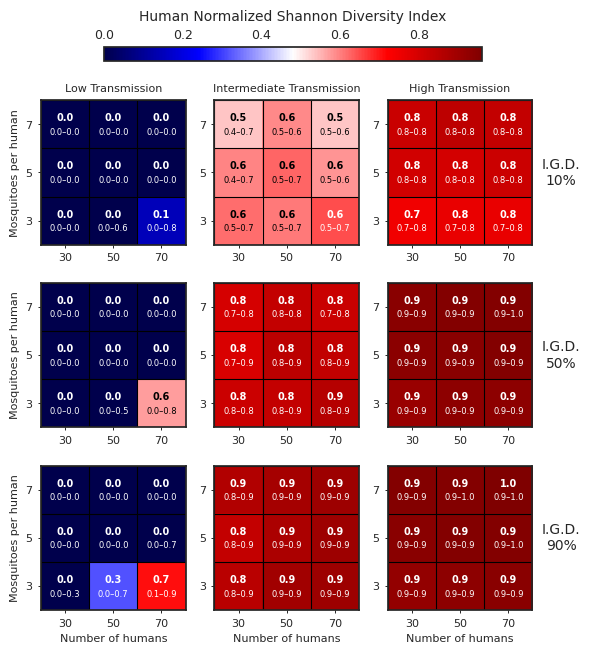

(<Figure size 629.921x708.661 with 10 Axes>,
 array([[<Axes: title={'center': 'Low Transmission'}, ylabel='Mosquitoes per human'>,
         <Axes: title={'center': 'Intermediate Transmission'}>,
         <Axes: title={'center': 'High Transmission'}>],
        [<Axes: ylabel='Mosquitoes per human'>, <Axes: >, <Axes: >],
        [<Axes: xlabel='Number of humans', ylabel='Mosquitoes per human'>,
         <Axes: xlabel='Number of humans'>,
         <Axes: xlabel='Number of humans'>]], dtype=object))

In [9]:
plot_comparative_heatmap_panel(metric="SH_Humans",
                               name_fig="Figure_S15",
                               fontsize_center=7,fontsize_spread=6,
                               center_decimals=1, spread_decimals=1)

In [2]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

plt.style.use("default")


# =========================
# Helpers
# =========================

def metric_display_name(metric):
    metric_names = {
        "Human_Inf": "Human Infection Prevalence (%)",
        "Mosquitoes_Inf": "Mosquito Infection Prevalence (%)",
        "HPC": "Human Polyclonal Prevalence (%)",
        "MPC": "Mosquito Polyclonal Prevalence (%)",
        "lambda_h": r"Human Force of Infection - $\lambda_H$",
        "lambda_v": r"Mosquito Force of Infection - $\lambda_V$",
        "MOI_Humans_mean": "Human MOI",
        "MOI_Humans_median": "Human MOI",
        "MOI_Mosquitoes_mean": "Mosquito MOI",
        "MOI_Mosquitoes_median": "Mosquito MOI",
        "PI_Humans": r"Human Genetic Diversity - $\pi_H$ (%)",
        "PI_Mosquitoes": r"Mosquito Genetic Diversity - $\pi_V$ (%)",
        "SH_Humans": "Human Shannon Index",
        "SH_Mosquitoes": "Mosquito Shannon Index",
        "ratio_reco": "Recombination Ratio (%)",
        "num_haplotypes": "Number of Haplotypes"
    }
    return metric_names.get(metric, metric)


def transmission_display_name(br):
    transmission_names = {
        "0.3": "Low Transmission",
        "1.0": "Intermediate Transmission",
        "3.0": "High Transmission",
    }
    return transmission_names.get(str(br), f"BR = {br}")


def apply_conversions(df, num_hum, num_mos, ratio_reco_as_percent=True):
    for col in ["HS", "HM", "HPC"]:
        if col in df.columns:
            df[col] = 100.0 * df[col] / num_hum

    for col in ["MS", "MC", "MPC"]:
        if col in df.columns:
            df[col] = 100.0 * df[col] / num_mos

    if "PI_Humans" in df.columns:
        df["PI_Humans"] *= 100.0

    if "PI_Mosquitoes" in df.columns:
        df["PI_Mosquitoes"] *= 100.0

    if ratio_reco_as_percent and "ratio_reco" in df.columns:
        df["ratio_reco"] *= 100.0

    if "HS" in df.columns:
        df["Human_Inf"] = 100.0 - df["HS"]

    if "MS" in df.columns:
        df["Mosquitoes_Inf"] = 100.0 - df["MS"]

    return df


# =========================
# Leer una simulación y resumir por día
# =========================

def load_daily_quantiles_for_scenario(
    sim_name,
    metric,
    num_humans,
    mos_x_human,
    results_root="./results/Comparative_Simulations",
    ratio_reco_as_percent=True,
    q_low=0.25,
    q_high=0.75
):
    """
    Lee todas las iteraciones de un escenario, agrupa por día y calcula:
    mediana, q_low, q_high
    """
    folder = os.path.join(results_root, sim_name)
    files = sorted(glob.glob(os.path.join(folder, "Iteration_proof_*.txt")))

    if len(files) == 0:
        print(f"[WARN] No files found for {sim_name}")
        return None

    num_mos = num_humans * mos_x_human
    all_df = []

    for rep_id, f in enumerate(files):
        df = pd.read_csv(f, sep=";")
        df = apply_conversions(
            df,
            num_hum=num_humans,
            num_mos=num_mos,
            ratio_reco_as_percent=ratio_reco_as_percent
        )

        if "time" not in df.columns or metric not in df.columns:
            continue

        tmp = df[["time", metric]].copy()
        tmp = tmp.dropna()
        tmp["day"] = tmp["time"].astype(int)
        tmp["rep"] = rep_id
        all_df.append(tmp[["day", "rep", metric]])

    if len(all_df) == 0:
        print(f"[WARN] No valid data for {sim_name}")
        return None

    big = pd.concat(all_df, ignore_index=True)

    # Por día, agrupar todas las iteraciones
    summary = (
        big.groupby("day")[metric]
        .agg(
            median="median",
            qlow=lambda x: x.quantile(q_low),
            qhigh=lambda x: x.quantile(q_high),
            mean="mean",
            std="std"
        )
        .reset_index()
        .sort_values("day")
    )

    return summary


# =========================
# Figura de diagnóstico 3x3
# =========================

def plot_comparative_daily_dynamics(
    metric,
    igd_values=(10, 50, 90),
    bite_rates=(0.3, 1.0, 3.0),
    num_hum_values=(30, 50, 70),
    mos_x_hum_values=(3, 5, 7),
    results_root="./results/Comparative_Simulations",
    ratio_reco_as_percent=True,
    q_low=0.25,
    q_high=0.75,
    width=18,
    height=14,
    linewidth=1.2,
    alpha_line=0.9,
    alpha_band=0.12,
    max_day=None,
    sharey=False
):
    """
    Panel 3x3:
      filas = IGD
      columnas = BR

    En cada subpanel:
      - eje x = día
      - eje y = métrica
      - una curva por combinación NH x MxH
      - banda = cuantiles entre iteraciones
    """

    fig, axes = plt.subplots(
        len(igd_values),
        len(bite_rates),
        figsize=(width, height),
        sharex=True,
        sharey=sharey
    )

    if len(igd_values) == 1 and len(bite_rates) == 1:
        axes = np.array([[axes]])
    elif len(igd_values) == 1:
        axes = np.array([axes])
    elif len(bite_rates) == 1:
        axes = np.array([[ax] for ax in axes])

    colors = {3: "tab:blue", 5: "tab:orange", 7: "tab:green"}
    linestyles = {30: "-", 50: "--", 70: ":"}

    legend_handles = []
    legend_labels = []
    used_labels = set()

    for r, igd in enumerate(igd_values):
        for c, br in enumerate(bite_rates):
            ax = axes[r, c]

            for nh in num_hum_values:
                for mxh in mos_x_hum_values:
                    sim_name = f"IGD_{igd}_BR_{br}_NH_{nh}_MxH_{mxh}"

                    summary = load_daily_quantiles_for_scenario(
                        sim_name=sim_name,
                        metric=metric,
                        num_humans=nh,
                        mos_x_human=mxh,
                        results_root=results_root,
                        ratio_reco_as_percent=ratio_reco_as_percent,
                        q_low=q_low,
                        q_high=q_high
                    )

                    if summary is None or len(summary) == 0:
                        continue

                    if max_day is not None:
                        summary = summary[summary["day"] <= max_day]

                    x = summary["day"].to_numpy()
                    y = summary["median"].to_numpy()
                    y1 = summary["qlow"].to_numpy()
                    y2 = summary["qhigh"].to_numpy()

                    color = colors.get(mxh, "gray")
                    ls = linestyles.get(nh, "-")
                    label = f"NH={nh}, MxH={mxh}"

                    ax.fill_between(
                        x, y1, y2,
                        color=color,
                        alpha=alpha_band
                    )

                    line, = ax.plot(
                        x, y,
                        color=color,
                        linestyle=ls,
                        linewidth=linewidth,
                        alpha=alpha_line,
                        label=label
                    )

                    if label not in used_labels:
                        legend_handles.append(line)
                        legend_labels.append(label)
                        used_labels.add(label)

            if r == 0:
                ax.set_title(transmission_display_name(br), fontsize=10)

            if c == 0:
                ax.set_ylabel(f"I.G.D. = {igd}%", fontsize=10)

            if r == len(igd_values) - 1:
                ax.set_xlabel("Time (days)", fontsize=10)

            ax.grid(True, alpha=0.25)
            ax.tick_params(labelsize=8)

    fig.suptitle(metric_display_name(metric), fontsize=12)

    fig.legend(
        legend_handles,
        legend_labels,
        loc="center left",
        bbox_to_anchor=(0.92, 0.5),
        frameon=False,
        fontsize=8
    )

    fig.subplots_adjust(
        left=0.08,
        right=0.88,
        top=0.92,
        bottom=0.08,
        wspace=0.20,
        hspace=0.20
    )

    plt.show()
    return fig, axes

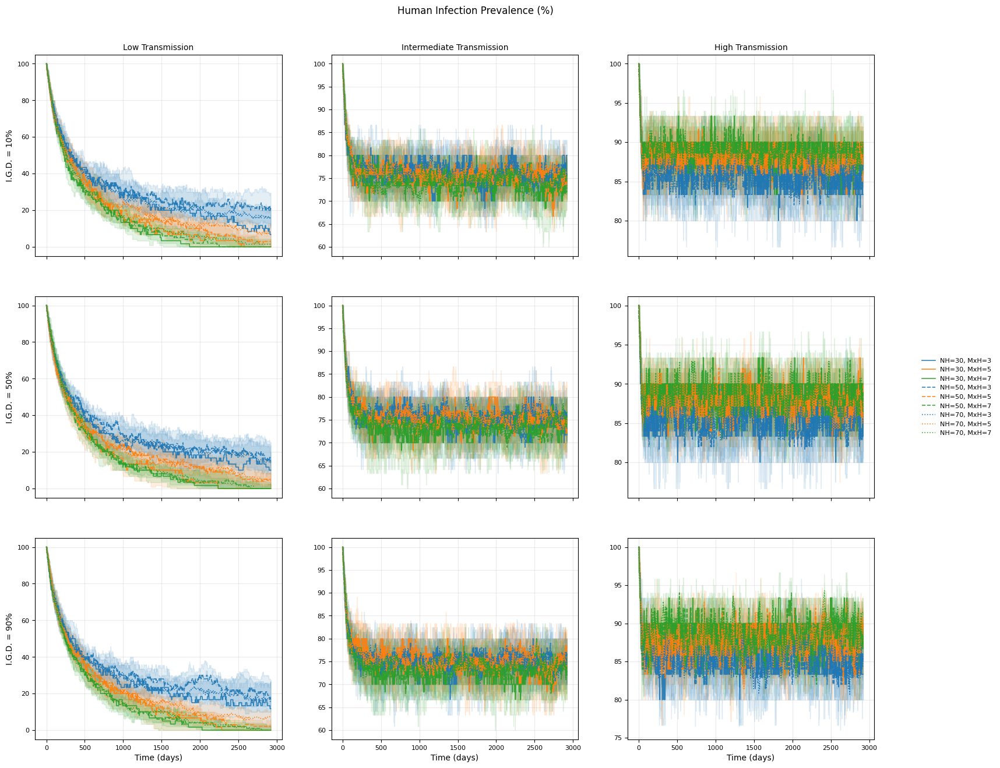

(<Figure size 1800x1400 with 9 Axes>,
 array([[<Axes: title={'center': 'Low Transmission'}, ylabel='I.G.D. = 10%'>,
         <Axes: title={'center': 'Intermediate Transmission'}>,
         <Axes: title={'center': 'High Transmission'}>],
        [<Axes: ylabel='I.G.D. = 50%'>, <Axes: >, <Axes: >],
        [<Axes: xlabel='Time (days)', ylabel='I.G.D. = 90%'>,
         <Axes: xlabel='Time (days)'>, <Axes: xlabel='Time (days)'>]],
       dtype=object))

In [3]:
plot_comparative_daily_dynamics(metric="Human_Inf",ratio_reco_as_percent=True)

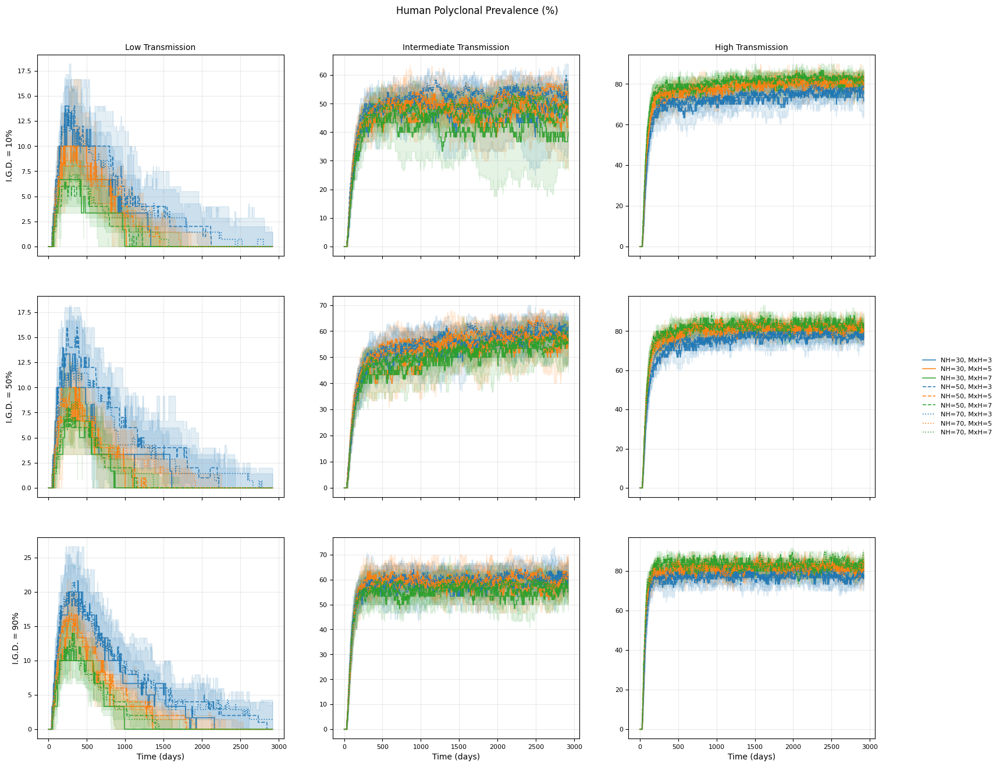

(<Figure size 1800x1400 with 9 Axes>,
 array([[<Axes: title={'center': 'Low Transmission'}, ylabel='I.G.D. = 10%'>,
         <Axes: title={'center': 'Intermediate Transmission'}>,
         <Axes: title={'center': 'High Transmission'}>],
        [<Axes: ylabel='I.G.D. = 50%'>, <Axes: >, <Axes: >],
        [<Axes: xlabel='Time (days)', ylabel='I.G.D. = 90%'>,
         <Axes: xlabel='Time (days)'>, <Axes: xlabel='Time (days)'>]],
       dtype=object))

In [4]:
plot_comparative_daily_dynamics( metric="HPC",ratio_reco_as_percent=True)

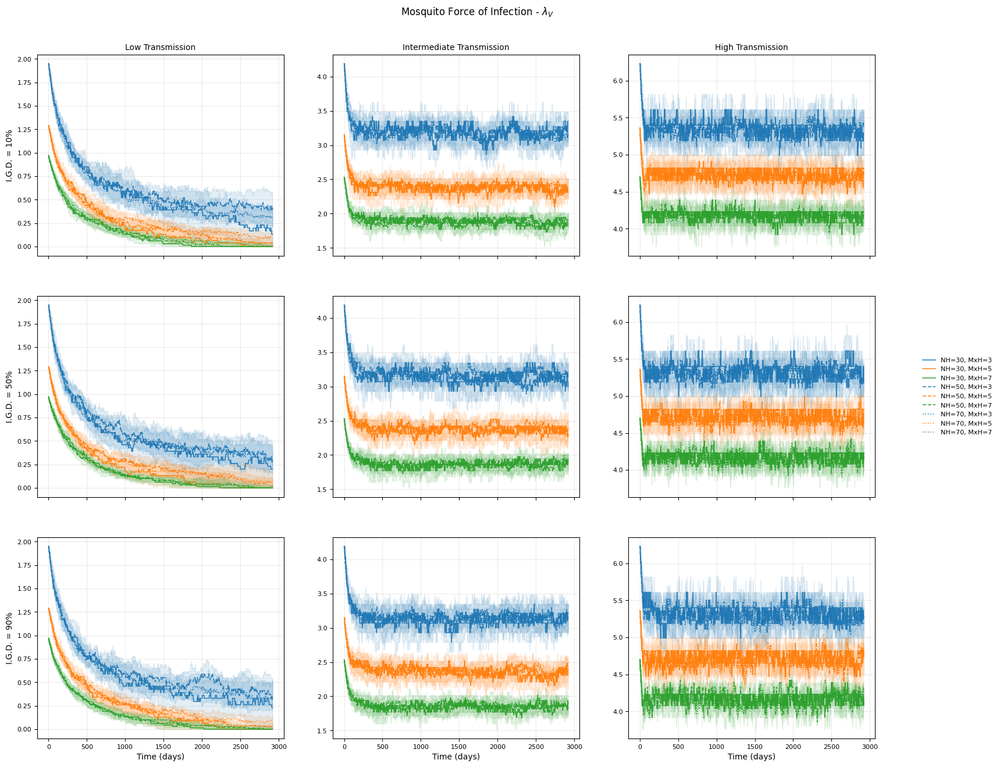

(<Figure size 1800x1400 with 9 Axes>,
 array([[<Axes: title={'center': 'Low Transmission'}, ylabel='I.G.D. = 10%'>,
         <Axes: title={'center': 'Intermediate Transmission'}>,
         <Axes: title={'center': 'High Transmission'}>],
        [<Axes: ylabel='I.G.D. = 50%'>, <Axes: >, <Axes: >],
        [<Axes: xlabel='Time (days)', ylabel='I.G.D. = 90%'>,
         <Axes: xlabel='Time (days)'>, <Axes: xlabel='Time (days)'>]],
       dtype=object))

In [6]:
plot_comparative_daily_dynamics( metric="lambda_v",ratio_reco_as_percent=True)

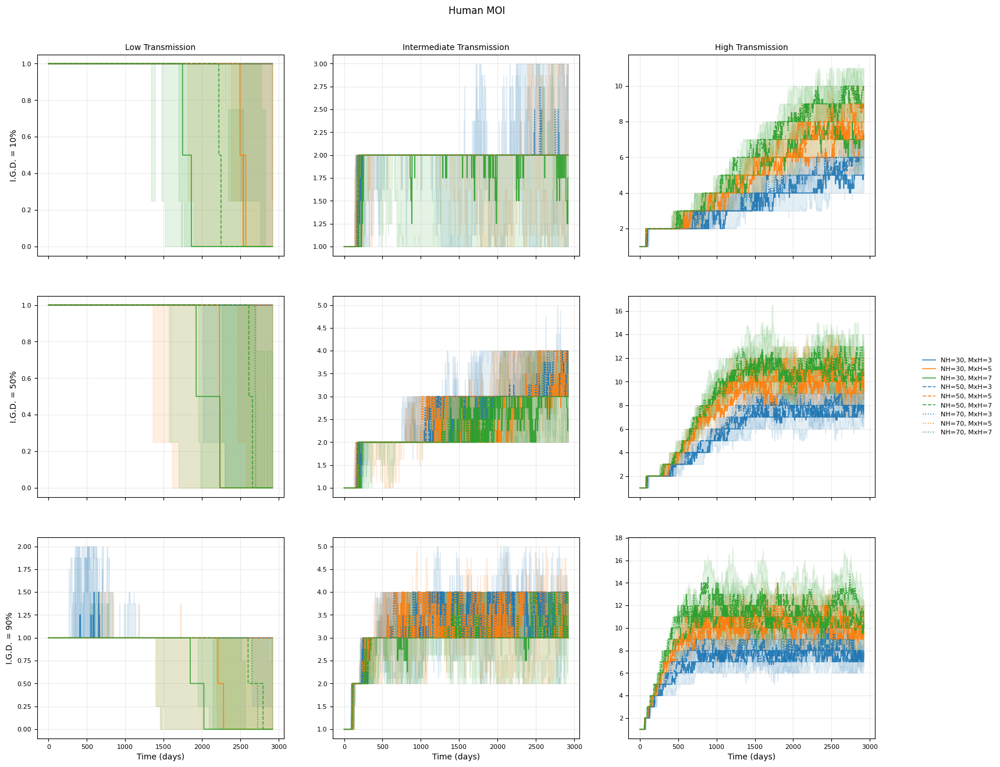

(<Figure size 1800x1400 with 9 Axes>,
 array([[<Axes: title={'center': 'Low Transmission'}, ylabel='I.G.D. = 10%'>,
         <Axes: title={'center': 'Intermediate Transmission'}>,
         <Axes: title={'center': 'High Transmission'}>],
        [<Axes: ylabel='I.G.D. = 50%'>, <Axes: >, <Axes: >],
        [<Axes: xlabel='Time (days)', ylabel='I.G.D. = 90%'>,
         <Axes: xlabel='Time (days)'>, <Axes: xlabel='Time (days)'>]],
       dtype=object))

In [7]:
plot_comparative_daily_dynamics( metric="MOI_Humans_median",ratio_reco_as_percent=True)

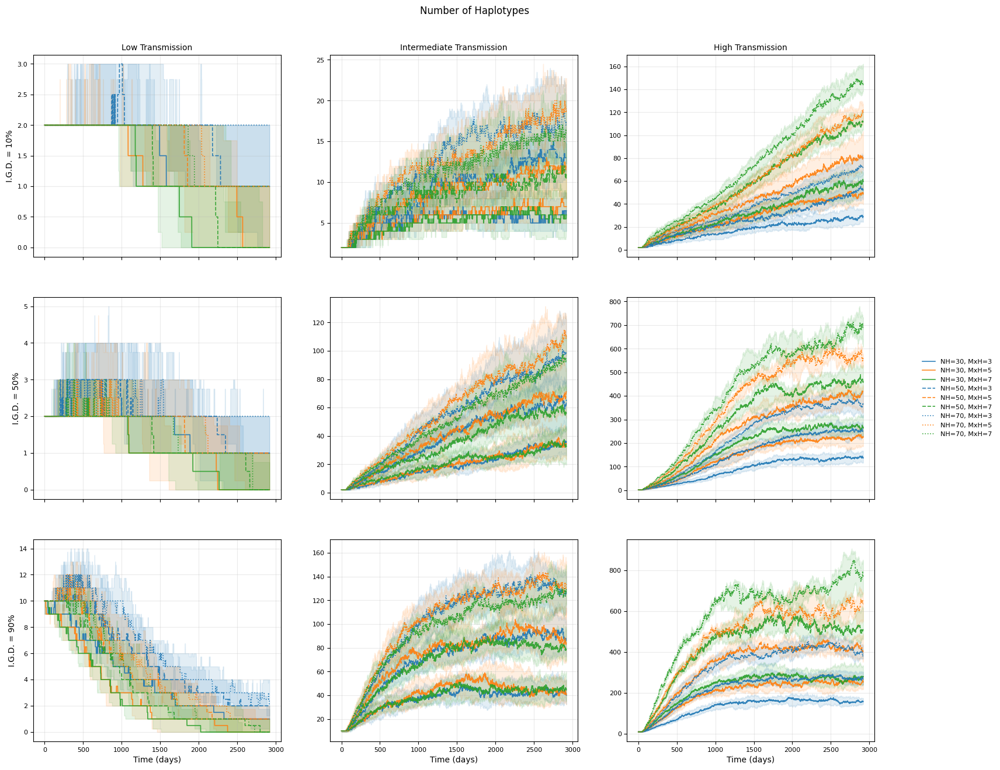

(<Figure size 1800x1400 with 9 Axes>,
 array([[<Axes: title={'center': 'Low Transmission'}, ylabel='I.G.D. = 10%'>,
         <Axes: title={'center': 'Intermediate Transmission'}>,
         <Axes: title={'center': 'High Transmission'}>],
        [<Axes: ylabel='I.G.D. = 50%'>, <Axes: >, <Axes: >],
        [<Axes: xlabel='Time (days)', ylabel='I.G.D. = 90%'>,
         <Axes: xlabel='Time (days)'>, <Axes: xlabel='Time (days)'>]],
       dtype=object))

In [8]:
plot_comparative_daily_dynamics( metric="num_haplotypes",ratio_reco_as_percent=True)

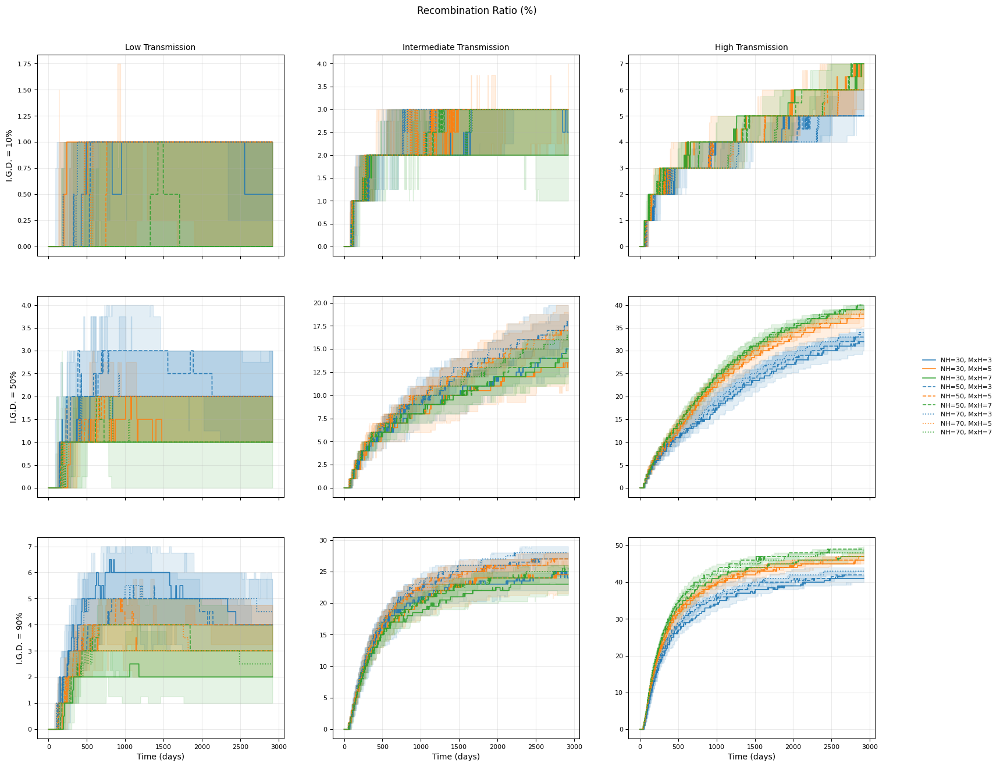

(<Figure size 1800x1400 with 9 Axes>,
 array([[<Axes: title={'center': 'Low Transmission'}, ylabel='I.G.D. = 10%'>,
         <Axes: title={'center': 'Intermediate Transmission'}>,
         <Axes: title={'center': 'High Transmission'}>],
        [<Axes: ylabel='I.G.D. = 50%'>, <Axes: >, <Axes: >],
        [<Axes: xlabel='Time (days)', ylabel='I.G.D. = 90%'>,
         <Axes: xlabel='Time (days)'>, <Axes: xlabel='Time (days)'>]],
       dtype=object))

In [9]:
plot_comparative_daily_dynamics( metric="ratio_reco",ratio_reco_as_percent=True)

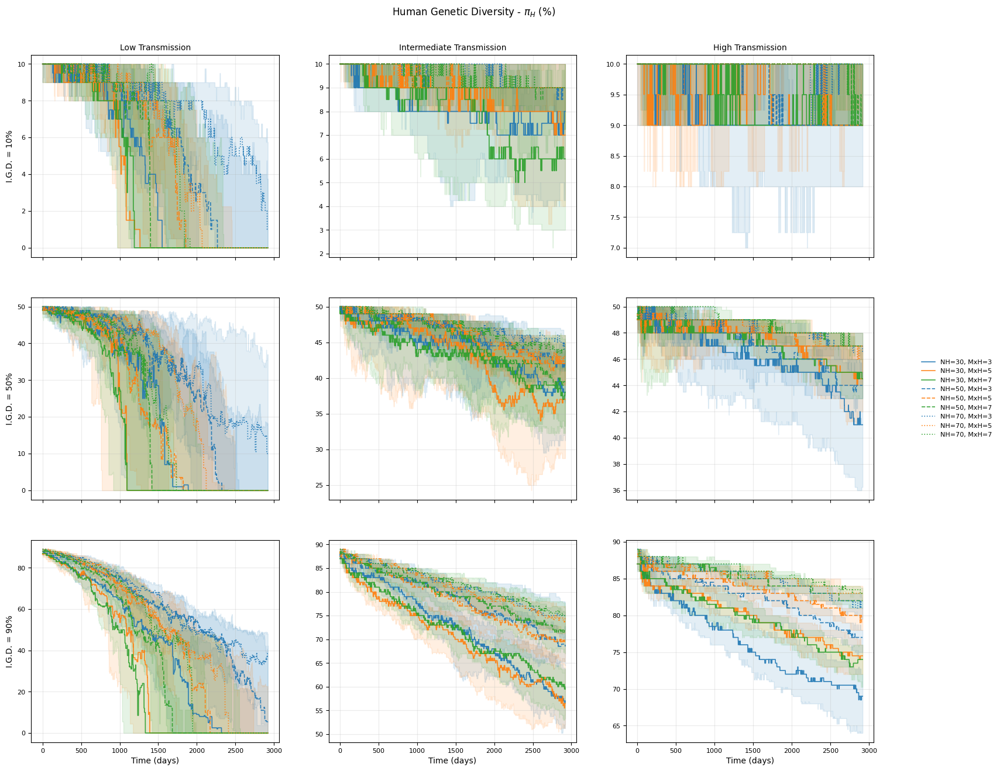

(<Figure size 1800x1400 with 9 Axes>,
 array([[<Axes: title={'center': 'Low Transmission'}, ylabel='I.G.D. = 10%'>,
         <Axes: title={'center': 'Intermediate Transmission'}>,
         <Axes: title={'center': 'High Transmission'}>],
        [<Axes: ylabel='I.G.D. = 50%'>, <Axes: >, <Axes: >],
        [<Axes: xlabel='Time (days)', ylabel='I.G.D. = 90%'>,
         <Axes: xlabel='Time (days)'>, <Axes: xlabel='Time (days)'>]],
       dtype=object))

In [10]:
plot_comparative_daily_dynamics( metric="PI_Humans",ratio_reco_as_percent=True)

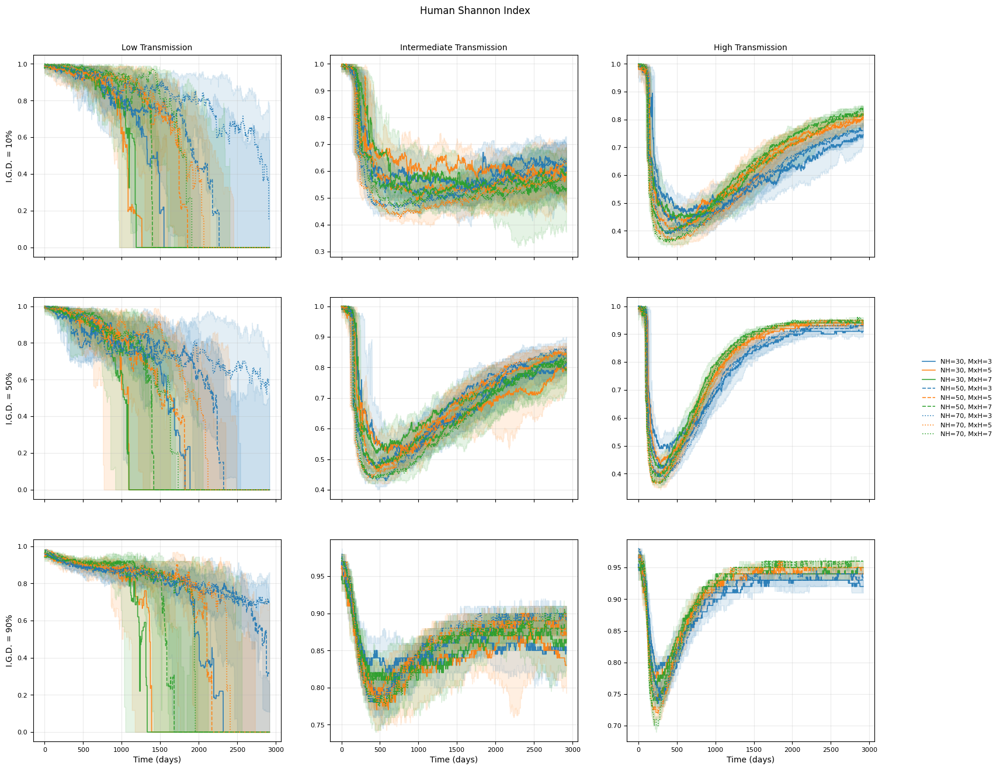

(<Figure size 1800x1400 with 9 Axes>,
 array([[<Axes: title={'center': 'Low Transmission'}, ylabel='I.G.D. = 10%'>,
         <Axes: title={'center': 'Intermediate Transmission'}>,
         <Axes: title={'center': 'High Transmission'}>],
        [<Axes: ylabel='I.G.D. = 50%'>, <Axes: >, <Axes: >],
        [<Axes: xlabel='Time (days)', ylabel='I.G.D. = 90%'>,
         <Axes: xlabel='Time (days)'>, <Axes: xlabel='Time (days)'>]],
       dtype=object))

In [11]:
plot_comparative_daily_dynamics( metric="SH_Humans",ratio_reco_as_percent=True)

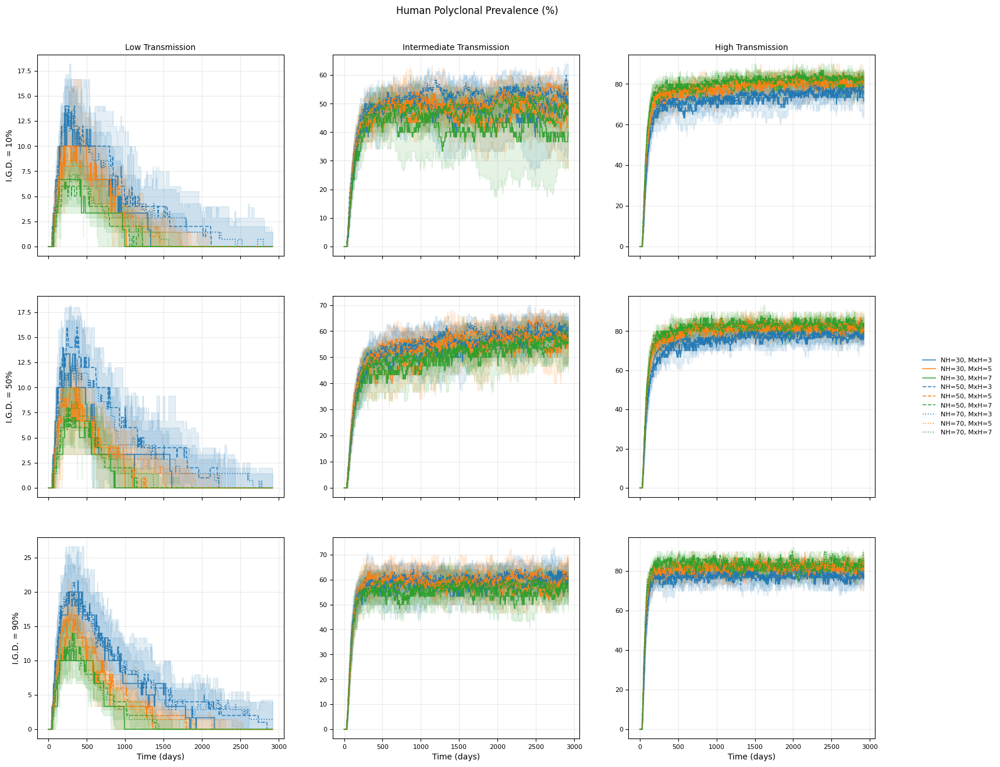

(<Figure size 1800x1400 with 9 Axes>,
 array([[<Axes: title={'center': 'Low Transmission'}, ylabel='I.G.D. = 10%'>,
         <Axes: title={'center': 'Intermediate Transmission'}>,
         <Axes: title={'center': 'High Transmission'}>],
        [<Axes: ylabel='I.G.D. = 50%'>, <Axes: >, <Axes: >],
        [<Axes: xlabel='Time (days)', ylabel='I.G.D. = 90%'>,
         <Axes: xlabel='Time (days)'>, <Axes: xlabel='Time (days)'>]],
       dtype=object))

In [12]:
plot_comparative_daily_dynamics( metric="HPC",ratio_reco_as_percent=True)